In [1]:
# Importing required libraries
import pandas as pd
import numpy as np
import os
import glob
from datetime import datetime
import pyarrow.parquet as pq
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
# Setting up the working directory
current_dir = os.getcwd()
parent_dir = os.path.dirname(current_dir)
grandparent_dir = os.path.dirname(parent_dir)
fin_disc_data_dir = os.path.join(grandparent_dir, 'data/financial_disc')

In [3]:
# Function to load data from the financial disclosure directory

def load_data(data_dir):
    '''
    This function is not memory efficient, but for <100 csv files, should work fine
    For example: this approach will have to be modified for docket/PACER data
    '''
    all_files = glob.glob(data_dir + "/*.csv")
    print(f"Found {len(all_files)} files in the directory")
    li = []
    for filename in all_files:
        try:
            df = pd.read_csv(filename, index_col=None, header=0)
            li.append(df)
        except Exception as e:
            print(f"Error reading file {filename}: {e}")
    return pd.concat(li, axis=0, ignore_index=True)

In [21]:
# Loading files from the financial disclosure directory
df_fin_disc = load_data(fin_disc_data_dir)

# Examine the data
df_fin_disc.info()

Found 54 files in the directory


/var/folders/54/mhs5zkcs6zb1_y58hd7pczjc0000gn/T/ipykernel_8108/1404753717.py:13: DtypeWarning: Columns (9) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(filename, index_col=None, header=0)
/var/folders/54/mhs5zkcs6zb1_y58hd7pczjc0000gn/T/ipykernel_8108/1404753717.py:13: DtypeWarning: Columns (44) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(filename, index_col=None, header=0)
/var/folders/54/mhs5zkcs6zb1_y58hd7pczjc0000gn/T/ipykernel_8108/1404753717.py:13: DtypeWarning: Columns (50) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(filename, index_col=None, header=0)
/var/folders/54/mhs5zkcs6zb1_y58hd7pczjc0000gn/T/ipykernel_8108/1404753717.py:13: DtypeWarning: Columns (50) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(filename, index_col=None, header=0)
/var/folders/54/mhs5zkcs6zb1_y58hd7pczjc0000gn/T/

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2019751 entries, 0 to 2019750
Data columns (total 52 columns):
 #   Column                               Dtype  
---  ------                               -----  
 0   person_id                            int64  
 1   person_url                           object 
 2   filepath                             object 
 3   disclosure_year                      int64  
 4   notes                                object 
 5   date_created                         object 
 6   date_modified                        object 
 7   type                                 object 
 8   agreement_id                         float64
 9   agree_date_raw                       object 
 10  parties_and_terms                    object 
 11  agree_redacted                       object 
 12  gift_id                              float64
 13  gift_source                          object 
 14  gift_description                     object 
 15  gift_value                      

### Challenge of handling multiple date columns:
We have the following date related columns in our dataset (disclosure year is straightforward): 
['date_created', 'date_modified', 'agree_date_raw', 'transaction_date_raw', 'transaction_date', 'non_inv_date_raw', 'date_raw_position', 'date_raw_reimb', 'sp_inc_date_raw']

The formats for 
1. _date_created_  and _date_modified_ are as an example: "2021-02-09T17:47:14.922230-08:00" where I think only the YYYY-MM-DD part is relevant. There are no nulls 
2. _agree_date_raw_ has mostly nan values, but the non-null dates that need to be retained are in the format "YYYY"
3. _transaction_date_raw_ has 50% nan values but the relevant dates have the format "MM/DD/YY"
4. _transaction_date_ also has 50% nan values but the relevant dates have the format "YYYY-MM-DD"
5. _non_inv_date_ has mostly null values but the relevant values have format "YYYY" 
6. _date_raw_position_ and "date_raw_reimb" were added by mistake and have all null values - these columns need to be deleted
7. _sp_inc_date_raw_ has mostly null values but the relevant values have format "YYYY" 

In [64]:
# We define a customized function (which can be modified for other use cases) to clean data:
# Created by GPT-4o. Based on the markdown points on date formats above
def clean_specific_date_columns(df):
    """
    Clean and standardize date-related columns in a DataFrame based on specific rules for each column.
    
    Parameters:
    df (pd.DataFrame): The DataFrame containing the columns to clean.
    
    Returns:
    pd.DataFrame: The DataFrame with the cleaned date columns.
    """
    
    # 1. Handle 'date_created' and 'date_modified' (Extract only the YYYY-MM-DD part)
    df['date_created'] = df['date_created'].apply(lambda x: pd.to_datetime(x).date() if pd.notnull(x) else pd.NA)
    df['date_modified'] = df['date_modified'].apply(lambda x: pd.to_datetime(x).date() if pd.notnull(x) else pd.NA)
    
    # 2. Handle 'agree_date_raw' (Retain only the year)
    df['agree_date_raw'] = df['agree_date_raw'].apply(lambda x: str(x) if pd.notnull(x) and str(x).isdigit() else pd.NA)
    
    # 3. Handle 'transaction_date_raw' (Convert MM/DD/YY to YYYY-MM-DD)
    df['transaction_date_raw'] = pd.to_datetime(df['transaction_date_raw'], format='%m/%d/%y', errors='coerce').dt.date
    
    # 4. Handle 'transaction_date' (Convert to YYYY-MM-DD if not already)
    df['transaction_date'] = pd.to_datetime(df['transaction_date'], format='%Y-%m-%d', errors='coerce').dt.date
    
    # 5. Handle 'non_inv_date_raw' (Retain only the year)
    df['non_inv_date_raw'] = df['non_inv_date_raw'].apply(lambda x: str(x) if pd.notnull(x) and str(x).isdigit() else pd.NA)
    
    # 6. Handle 'sp_inc_date_raw' (Retain only the year)
    df['sp_inc_date_raw'] = df['sp_inc_date_raw'].apply(lambda x: str(x) if pd.notnull(x) and str(x).isdigit() else pd.NA)
    
    # 7. Drop 'date_raw_position' and 'date_raw_reimb' as they have all null values
    df = df.drop(columns=['date_raw_position', 'date_raw_reimb'])
    
    return df

In [59]:
# Clean the date columns in the financial disclosure data
df_fin_disc_cleaned = clean_specific_date_columns(df_fin_disc)
df_fin_disc_cleaned.head()

,person_id,person_url,filepath,disclosure_year,notes,date_created,date_modified,type,agreement_id,agree_date_raw,...,reimbursement_id,reimb_source,reimb_location,reimb_purpose,items_paid_or_provided,reimb_redacted,spouse_income_id,sp_inc_source_type,sp_inc_date_raw,sp_inc_redacted
0,2885,https://www.courtlistener.com/api/rest/v4/peop...,https://storage.courtlistener.com/us/federal/j...,2014,"Under Section V11, Item 26:\n\nThere were no t...",2021-01-10,2021-01-10,agreement,8339.0,1997,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,<NA>,NaN
1,2885,https://www.courtlistener.com/api/rest/v4/peop...,https://storage.courtlistener.com/us/federal/j...,2014,"Under Section V11, Item 26:\n\nThere were no t...",2021-01-10,2021-01-10,investment,NaN,<NA>,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,<NA>,NaN
2,2885,https://www.courtlistener.com/api/rest/v4/peop...,https://storage.courtlistener.com/us/federal/j...,2014,"Under Section V11, Item 26:\n\nThere were no t...",2021-01-10,2021-01-10,investment,NaN,<NA>,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,<NA>,NaN
3,2885,https://www.courtlistener.com/api/rest/v4/peop...,https://storage.courtlistener.com/us/federal/j...,2014,"Under Section V11, Item 26:\n\nThere were no t...",2021-01-10,2021-01-10,investment,NaN,<NA>,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,<NA>,NaN
4,2885,https://www.courtlistener.com/api/rest/v4/peop...,https://storage.courtlistener.com/us/federal/j...,2014,"Under Section V11, Item 26:\n\nThere were no t...",2021-01-10,2021-01-10,investment,NaN,<NA>,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,<NA>,NaN


**While this was an expensive operation (applying row-wise operations), we had to do it only once. Next time onwards, we can use import the cleaned parquet file.**

In [61]:
# Save data to a parquet file for future use
df_fin_disc_cleaned.to_parquet(os.path.join(grandparent_dir, 'data/financial_disc/financial_disc.parquet'), index=False)

In [4]:
# Import the parquet as a dataframe to check if the data was saved correctly
df_fin_disc_cleaned = pd.read_parquet(os.path.join(grandparent_dir, 'data/financial_disc/financial_disc.parquet'))
df_fin_disc_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2019751 entries, 0 to 2019750
Data columns (total 50 columns):
 #   Column                               Dtype  
---  ------                               -----  
 0   person_id                            int64  
 1   person_url                           object 
 2   filepath                             object 
 3   disclosure_year                      int64  
 4   notes                                object 
 5   date_created                         object 
 6   date_modified                        object 
 7   type                                 object 
 8   agreement_id                         float64
 9   agree_date_raw                       object 
 10  parties_and_terms                    object 
 11  agree_redacted                       object 
 12  gift_id                              float64
 13  gift_source                          object 
 14  gift_description                     object 
 15  gift_value                      

In [6]:
# Exploring disclosures by persion_id
# Get disclosure for person_id = 420
person_id = 3144
df_sample_disclosures = df_fin_disc_cleaned[df_fin_disc_cleaned['person_id'] == person_id]

# Display the sample disclosures
df_sample_disclosures.head()

# Optional: Save the sample disclosures to a CSV file
df_sample_disclosures.to_csv('specific_disc_sample.csv')

In [5]:
# Let us see how many unique persons, disclosures and investments are there in the dataset
print(f"Number of unique persons in the dataset: {df_fin_disc_cleaned['person_id'].nunique()}")
print(f"Number of unique disclosures in the dataset: {df_fin_disc_cleaned['filepath'].nunique()}")
print(f"Number of unique investments in the dataset: {df_fin_disc_cleaned['investment_id'].nunique()}")

Number of unique persons in the dataset: 3349
Number of unique disclosures in the dataset: 30436
Number of unique investments in the dataset: 1901720


In [42]:
# Explorting a random sample of x rows to a csv file for manual examination
x = 10000
df_fin_disc_cleaned.sample(x).to_csv("sample.csv", index=False)

### Research Questions for Analysis:

<ins>From disclosure documents:</ins>  
    1. How many disclosures do we have across years?  
    2. How many unique persons are covered every year?  
    3. Who are these people?  

<ins>From disclosures and people-positions join:</ins> 
    1. From the persons database, how many judges did we have?   
    2. How many of those judges have financial disclosures?  
    3. For the judges that don't have financial disclosures, what are their characteristics? (duration of judgeship, court practiced in, race etc.)  
    4. For the judges that do, summarize data based on race, political affiliation, court in which practice is done  

In [61]:
# Calculating total counts for disclosures and persons
disclosure_unique_counts = df_fin_disc_cleaned['filepath'].nunique()
person_unique_counts = df_fin_disc_cleaned['person_id'].nunique()
print(f"Total number of unique disclosures: {disclosure_unique_counts}")
print(f"Total number of unique persons: {person_unique_counts}")

Total number of unique disclosures: 30436
Total number of unique persons: 3349


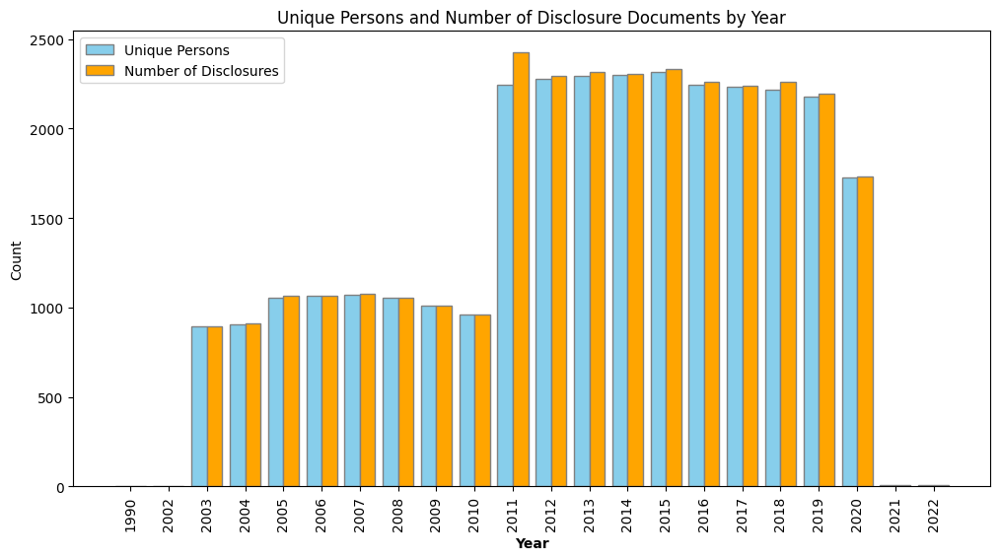

In [60]:
# Aggregating count of disclosures (unique filepaths) and count of unique persons by disclosure_year
disc_persons_by_year = df_fin_disc_cleaned.groupby('disclosure_year').agg({'person_id': pd.Series.nunique, 'filepath': pd.Series.nunique}).reset_index()
disc_persons_by_year.columns = ['disclosure_year', 'num_persons', 'num_disclosures']

# Plotting a bar for for number of persons and disclosures by year

plt.figure(figsize=(12, 6))

# Define the width of the bars
bar_width = 0.4

# Create an array of positions for the years
r1 = np.arange(len(disc_persons_by_year['disclosure_year']))

# Create an array for the positions of the second set of bars
r2 = [x + bar_width for x in r1]

# Plot the bars for the number of persons
plt.bar(r1, 
        disc_persons_by_year['num_persons'], 
        color='skyblue', 
        width=bar_width, 
        edgecolor='grey', 
        label='Unique Persons')

# Plot the bars for the number of disclosures next to the persons
plt.bar(r2, 
        disc_persons_by_year['num_disclosures'], 
        color='orange', 
        width=bar_width, 
        edgecolor='grey', 
        label='Number of Disclosures')

# Set the x-axis labels and ticks
plt.xlabel('Year', fontweight='bold')
plt.xticks([r + bar_width / 2 for r in range(len(disc_persons_by_year['disclosure_year']))], 
           disc_persons_by_year['disclosure_year'], rotation=90)

# Add labels and title
plt.ylabel('Count')
plt.title('Unique Persons and Number of Disclosure Documents by Year')

# Add a legend
plt.legend()

# Show the plot
plt.show()

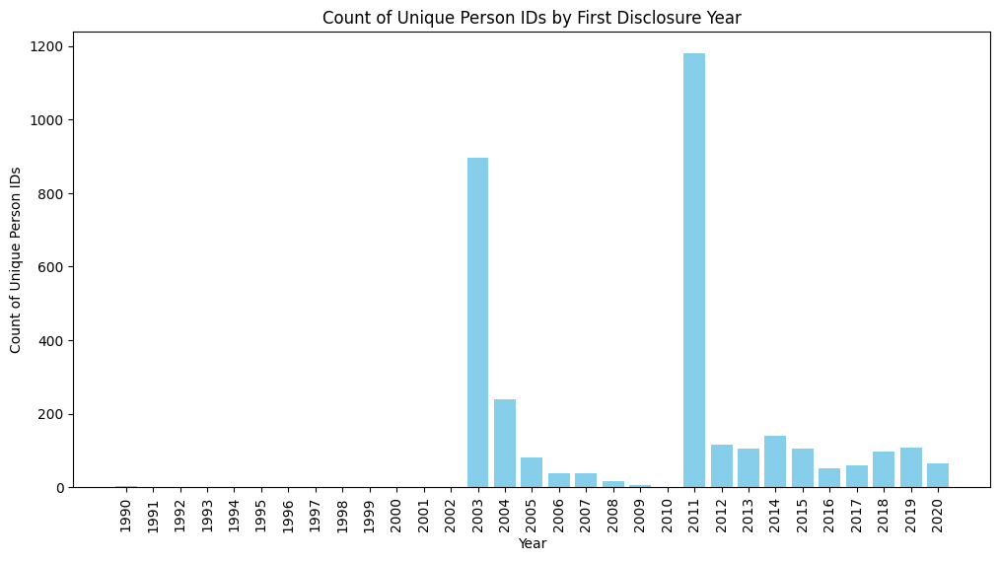

In [83]:
# We can also plot the histogram of unique person_id counts as first seen in the dataset
first_appearance = df_fin_disc_cleaned.groupby('person_id')['disclosure_year'].min().reset_index()

# Count the number of person_id values per year
yearly_counts = first_appearance['disclosure_year'].value_counts().sort_index()

# Plot the histogram 
plt.figure(figsize=(12, 6))
plt.bar(yearly_counts.index, yearly_counts.values, color='skyblue')
years = range(first_appearance['disclosure_year'].min(), first_appearance['disclosure_year'].max() + 1)
plt.xticks(years, rotation=90)
plt.xlabel('Year')
plt.ylabel('Count of Unique Person IDs')
plt.title('Count of Unique Person IDs by First Disclosure Year')
plt.show()

In [6]:
# Importing the persons and positions data from persons_positions.csv
current_dir = os.getcwd()
parent_dir = os.path.dirname(current_dir)
grandparent_dir = os.path.dirname(parent_dir)
persons_positions_dir = os.path.join(grandparent_dir, 'data/persons_positions')
df_persons_positions = pd.read_csv(os.path.join(persons_positions_dir, 'persons_positions_modified.csv'))

# Examine the data
df_persons_positions.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51281 entries, 0 to 51280
Data columns (total 21 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   person_id               51281 non-null  int64  
 1   name_first              51281 non-null  object 
 2   name_middle             43300 non-null  object 
 3   name_last               51281 non-null  object 
 4   political_affiliations  35456 non-null  object 
 5   race                    33919 non-null  object 
 6   position_url            51281 non-null  object 
 7   position_type           30056 non-null  object 
 8   job_title               21225 non-null  object 
 9   sector                  6764 non-null   float64
 10  organization            13248 non-null  object 
 11  date_nominated          4274 non-null   object 
 12  date_start              50412 non-null  object 
 13  date_termination        42457 non-null  object 
 14  court_resource_url      22174 non-null

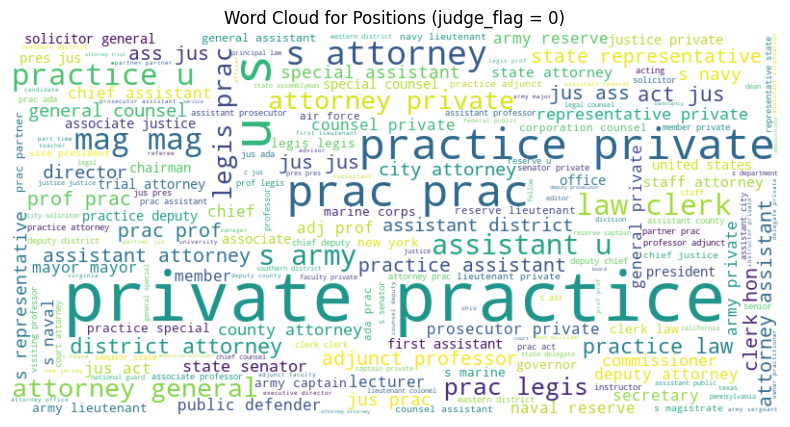

In [67]:
# Wordcloud of positions for judge_flag = 0 to check what stands out
from wordcloud import WordCloud
filtered_df = df_persons_positions[df_persons_positions['judge_flag'] == 0]

# Concatenate all position values into a single string
text = ' '.join(filtered_df['position'].dropna().values)

# Generate the word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)

# Plot the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')  # Hide the axes
plt.title('Word Cloud for Positions (judge_flag = 0)')
plt.show()

In [85]:
# Check the positions count for the top 20 positions
filtered_df['position'].value_counts().head(25)

position
private practice               5358
prac                           3677
mag                             969
legis                           702
assistant u.s. attorney         623
jus                             596
law clerk                       434
prof                            420
act-jus                         379
clerk                           362
state representative            347
ass-jus                         332
ada                             280
u.s. army                       279
member                          212
adjunct professor               206
com                             200
mayor                           200
partner                         198
state senator                   178
justice                         176
city attorney                   159
assistant attorney general      157
assistant district attorney     149
adj-prof                        143
Name: count, dtype: int64

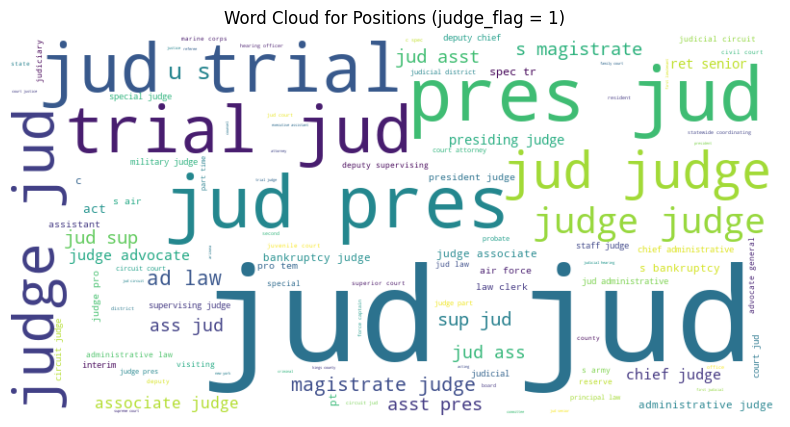

In [86]:
# Exploring a similar word cloud for judge_flag = 1
filtered_df_judges = df_persons_positions[df_persons_positions['judge_flag'] == 1]
text = ' '.join(filtered_df_judges['position'].dropna().values)

# Generate the word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)

# Plot the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')  # Hide the axes
plt.title('Word Cloud for Positions (judge_flag = 1)')
plt.show()

In [87]:
# Check the positions count for the top 20 positions
filtered_df_judges['position'].value_counts().head(20)

position
jud                      17319
pres-jud                  1975
trial-jud                 1710
judge                     1352
ad-law-jud                 113
u.s. magistrate judge       99
sup-jud                     94
asst-pres-jud               88
ass-jud                     80
associate judge             56
ret-senior-jud              51
chief judge                 49
presiding judge             42
act-jud                     40
spec-tr-jud                 31
u.s. bankruptcy judge       26
jud-pt                      25
c-jud                       23
judge pro tem               19
president judge             17
Name: count, dtype: int64

**Copying the analysis from 01_persons_positions to get the number of judges**

In [7]:
# To break down universe of people into interpretable sets, let's take the count of all positions and judge positions, which are given by judge_flag
judges_venn = df_persons_positions.groupby('person_id').agg({'judge_flag': 'sum', 'position': 'count'}).reset_index()

# Now, let's find count of person_ids that ONLY have judge flag = 0. These people are NOT JUDGES
only_non_judges_count = ((judges_venn['judge_flag'] == 0)).sum()

# Now, let's find the count of judges with just 1 position, They will have judge_flag = 1 and the number of positions = 1
only_judges_count = ((judges_venn['judge_flag'] == 1) & (judges_venn['position'] == 1)).sum()

# Now, let's find count of judges that have more than 1 position and at least 1 judge position
judges_with_other_positions_count = ((judges_venn['judge_flag'] >= 1) & (judges_venn['position'] > 1)).sum()

# Now let's add the status of the person_id to the dataframe
judges_venn['status'] = 'NA'
judges_venn.loc[(judges_venn['judge_flag'] == 0), 'status'] = 'non-judge'
judges_venn.loc[(judges_venn['judge_flag'] == 1) & (judges_venn['position'] == 1), 'status'] = 'judge with 1 position'
judges_venn.loc[(judges_venn['judge_flag'] > 0) & (judges_venn['position'] > 1), 'status'] = 'judge with multiple positions'

# Print all values
print(f"Total number of person_ids: {df_persons_positions['person_id'].nunique()}")
print(f"Non-judges: {only_non_judges_count}")
print(f"Judges with just one position: {only_judges_count}")
print(f"Judges with multiple positions: {judges_with_other_positions_count}")

Total number of person_ids: 15604
Non-judges: 1325
Judges with just one position: 4977
Judges with multiple positions: 9302


In [76]:
# Examining judges_venn dataframe for judges with 1 position
judges_venn[judges_venn['status'] == 'judge with 1 position'].head(20)


,person_id,judge_flag,position,status
360,361,1,1,judge with 1 position
438,439,1,1,judge with 1 position
572,573,1,1,judge with 1 position
815,816,1,1,judge with 1 position
976,977,1,1,judge with 1 position
1170,1171,1,1,judge with 1 position
1217,1218,1,1,judge with 1 position
1523,1524,1,1,judge with 1 position
1963,1964,1,1,judge with 1 position
2313,2314,1,1,judge with 1 position


In [8]:
# Analysis 1: How many unique people have financial disclosures
# Extracting unique people who have non-null values in 'person_id' and 'filepath'
people_disclosures = df_fin_disc_cleaned[['person_id','filepath']].dropna().drop_duplicates().reset_index(drop=True)
print(f'Total rows in disclosures are: {people_disclosures.shape[0]}')
print(f'Unique people covered in disclosures are: {people_disclosures["person_id"].nunique()}')
print(f'Top 5 rows of the unique people with disclosures are: \n{people_disclosures.head(5)}')

Total rows in disclosures are: 30436
Unique people covered in disclosures are: 3349
Top 5 rows of the unique people with disclosures are: 
   person_id                                           filepath
0       2885  https://storage.courtlistener.com/us/federal/j...
1       1155  https://storage.courtlistener.com/us/federal/j...
2       1453  https://storage.courtlistener.com/us/federal/j...
3       1428  https://storage.courtlistener.com/us/federal/j...
4       1909  https://storage.courtlistener.com/us/federal/j...


In [9]:
# Let's create a dataframe with person_id and their number of disclosure documents
people_disclosures_unique = people_disclosures.groupby('person_id').count().reset_index()
people_disclosures_unique.columns = ['person_id', 'disclosures_count']
people_disclosures_unique.head()

,person_id,disclosures_count
0,44,5
1,45,9
2,48,14
3,49,6
4,51,7


### Disclosures cover 3349 people. Are they all judges? Which judges are not covered?

In [10]:
# Assuming judges_venn is more comprehensive, left join judges_venn with unique_people_with_disclosures to get the status of people with disclosures
people_coverage_across_sources = pd.merge(judges_venn, people_disclosures_unique, on='person_id', how='left')
people_coverage_across_sources['status'] = people_coverage_across_sources['status'].fillna('non-disclosure')
people_coverage_across_sources['status'].value_counts()

status
judge with multiple positions    9302
judge with 1 position            4977
non-judge                        1325
Name: count, dtype: int64

In [11]:
# Let's calculate count of status for people with disclosures
people_coverage_across_sources[people_coverage_across_sources['disclosures_count'] > 0]['status'].value_counts()

status
judge with multiple positions    1856
non-judge                         871
judge with 1 position             620
Name: count, dtype: int64

#### <ins> Key Takeaways </ins>:
* 3349 people have disclosures, out of which 2 do not have person IDs in the main table 
* Breakdown of person type and availability of disclosures:  
     - Total people are 15,604
     - 1,325 are not judges; **871 (66%)** of these have disclosures
     - 4,977 are judges with just 1 position; **620 (12%)** of these have disclosures
     - 9,302 are judges with multiple positions; **1856 (20%)** of these have disclosures  

<ins>**Why is the coverage like this?**</ins>
1. From CourtListener:  
    - The Ethics in Government Act of 1978 requires that **senior government officials** file annual disclosures listing their personal financial interests. In the Judicial Branch, this law applies to **certain judicial employees** and all judges.

    - Historically, these disclosures were not collected systematically because it was too difficult to do so. Each disclosure had to be requested individually by fax, and had to be paid for by check. A big change to this policy came in the March, 2017 meeting of the Judicial Conference, where they created a new policy that allowed the disclosures to be released on "electronic storage devices…at no cost to the requestor."

    - They give yearly file counts but not the mapping of those files to actual disclosure metrics (people, investments etc.)

2. Who are the 1,325 non-judges?
    - Titles include _[magistrate, assistant US attorney, deputy district attorney]_

3. From the 4,977 judges with only 1 position, why do only 620 have disclosures?
    - Hypothesis is year when these disclosures were scraped/were made available
    - We can check the date nomination, termination to 

4. Similarly, for judges with multiple positions, we can find the date_nominated, date_start, date_terminated

In addition to these columns, let's also source
- political_affiliations  
- race
- court_short_name
- court_full_name

In [12]:
# Merging the people_coverage_across_sources with the persons_positions data
# Step 1: Merge to add general columns for everyone
people_disc_pos = pd.merge(
    people_coverage_across_sources,
    df_persons_positions[['person_id', 'name_first', 'name_middle', 'name_last', 'political_affiliations', 'race']],
    on='person_id',
    how='left'
)
# Drop duplicates
people_disc_pos = people_disc_pos.drop_duplicates().reset_index(drop=True)

# Examine the dataframe
print(f'Shape of the dataset is {people_disc_pos.shape}')
people_disc_pos.tail(20)

Shape of the dataset is (15604, 10)


,person_id,judge_flag,position,status,disclosures_count,name_first,name_middle,name_last,political_affiliations,race
15584,16214,0,1,non-judge,NaN,Wayne,R,Douglas,NaN,w
15585,16215,1,1,judge with 1 position,3.0,John,D,Roberts,NaN,NaN
15586,16216,1,1,judge with 1 position,NaN,Toby,J,Heytens,NaN,w
15587,16217,0,1,non-judge,NaN,Mary,Isabel,Yu,NaN,a
15588,16218,0,1,non-judge,NaN,Raquel,Devahl,Montoya-Lewis,NaN,p
15589,16219,0,1,non-judge,NaN,Grace,Helen,Whitener,NaN,b
15590,16220,1,1,judge with 1 position,NaN,Beth,M,Andrus,NaN,w
15591,16221,1,1,judge with 1 position,NaN,Lori,K,Smith,NaN,NaN
15592,16222,1,1,judge with 1 position,NaN,David,S,Mann,NaN,NaN
15593,16223,1,1,judge with 1 position,NaN,Cecily,NaN,Hazelrigg-Hernandez,NaN,NaN


In [13]:
# Step 2: Filter for judge_flag == 1 and get the last position by sorting by date_start
last_judge_positions = df_persons_positions[df_persons_positions['judge_flag'] == 1].sort_values(by='date_start')

# For each person, get the last position where judge_flag is 1
last_judge_positions = last_judge_positions.groupby('person_id').tail(1)

# Step 3: Merge to add columns for those with judge_flag <> 0
# Add columns only if the person has judge_flag = 1
people_disc_pos_dates = pd.merge(
    people_disc_pos,
    last_judge_positions[['person_id', 'date_nominated', 'date_start', 'date_termination', 'court_short_name', 'court_full_name']],
    on='person_id',
    how='left'
)
# Drop duplicates
people_disc_pos_dates = people_disc_pos_dates.drop_duplicates().reset_index(drop=True)

# Examine the dataframe
print(f'Shape of the dataset is {people_disc_pos_dates.shape}')
people_disc_pos_dates.tail(20)

Shape of the dataset is (15604, 15)


,person_id,judge_flag,position,status,disclosures_count,name_first,name_middle,name_last,political_affiliations,race,date_nominated,date_start,date_termination,court_short_name,court_full_name
15584,16214,0,1,non-judge,NaN,Wayne,R,Douglas,NaN,w,NaN,NaN,NaN,NaN,NaN
15585,16215,1,1,judge with 1 position,3.0,John,D,Roberts,NaN,NaN,NaN,NaN,2010-01-01,D. Alaska,"District Court, D. Alaska"
15586,16216,1,1,judge with 1 position,NaN,Toby,J,Heytens,NaN,w,2021-07-13,2021-11-02,NaN,Fourth Circuit,Court of Appeals for the Fourth Circuit
15587,16217,0,1,non-judge,NaN,Mary,Isabel,Yu,NaN,a,NaN,NaN,NaN,NaN,NaN
15588,16218,0,1,non-judge,NaN,Raquel,Devahl,Montoya-Lewis,NaN,p,NaN,NaN,NaN,NaN,NaN
15589,16219,0,1,non-judge,NaN,Grace,Helen,Whitener,NaN,b,NaN,NaN,NaN,NaN,NaN
15590,16220,1,1,judge with 1 position,NaN,Beth,M,Andrus,NaN,w,2018-06-01,NaN,NaN,Court of Appeals of Washington,Court of Appeals of Washington
15591,16221,1,1,judge with 1 position,NaN,Lori,K,Smith,NaN,NaN,2018-08-01,NaN,NaN,Court of Appeals of Washington,Court of Appeals of Washington
15592,16222,1,1,judge with 1 position,NaN,David,S,Mann,NaN,NaN,2016-08-16,NaN,NaN,Court of Appeals of Washington,Court of Appeals of Washington
15593,16223,1,1,judge with 1 position,NaN,Cecily,NaN,Hazelrigg-Hernandez,NaN,NaN,2019-01-14,NaN,NaN,Court of Appeals of Washington,Court of Appeals of Washington


In [41]:
# Temporary save the dataframe to a csv file for manual examination
people_disc_pos_dates.to_csv('people_disc_pos_dates.csv', index=False)

### <ins> Next steps for analysis </ins>:
1. Check fill rates for date related columns - date_nominated, **date_start**, date_terminated
2. Aggregate by _year_ to check disclosures are from what years
3. Aggregate by _race_ and _political affiliation_ and _court long name_ to check disclosures are for what kind of people
4. We can run the court_long_name past GPT to check whether these are local/state or federal courts

### Dealing with date formatting: 
* The column **date_start** has dates in the following 2 formats: _YYYY-MM-DD_ and _DD-MM-YY_
* To extract the year, we will write a function

In [14]:
# Function to extract year from date string
def extract_year(date_str):
    try:
        # Check if the date is in 'YYYY-MM-DD' format
        if len(date_str) == 10 and date_str[4] == '-' and date_str[7] == '-':
            return pd.to_datetime(date_str, format='%Y-%m-%d').year
        else:
            # Assume it's in 'DD-MM-YY' format
            return pd.to_datetime(date_str, format='%d-%m-%y').year
    except Exception:
        return pd.NA  # Handle any unexpected formats or errors

In [16]:
# Apply the function and create the new column 'date_start_year'
people_disc_pos_dates['date_start_year'] = people_disc_pos_dates['date_start'].apply(extract_year)
people_disc_pos_dates.head(20)

,person_id,judge_flag,position,status,disclosures_count,name_first,name_middle,name_last,political_affiliations,race,date_nominated,date_start,date_termination,court_short_name,court_full_name,date_start_year
0,1,0,1,non-judge,NaN,George,NaN,Washington,f,w,NaN,NaN,NaN,NaN,NaN,<NA>
1,2,0,1,non-judge,NaN,John,NaN,Adams,f,w,NaN,NaN,NaN,NaN,NaN,<NA>
2,3,0,1,non-judge,NaN,Thomas,NaN,Jefferson,j,w,NaN,NaN,NaN,NaN,NaN,<NA>
3,4,0,1,non-judge,NaN,James,NaN,Madison,j,w,NaN,NaN,NaN,NaN,NaN,<NA>
4,5,0,1,non-judge,NaN,James,NaN,Monroe,j,w,NaN,NaN,NaN,NaN,NaN,<NA>
5,6,0,1,non-judge,NaN,John,Quincy,Adams,j,w,NaN,NaN,NaN,NaN,NaN,<NA>
6,7,0,1,non-judge,NaN,Andrew,NaN,Jackson,d,w,NaN,NaN,NaN,NaN,NaN,<NA>
7,8,0,1,non-judge,NaN,Martin,Van,Buren,d,w,NaN,NaN,NaN,NaN,NaN,<NA>
8,9,3,4,judge with multiple positions,NaN,William,Henry,Harrison,w,w,NaN,2001-12-31,2010-11-03,"California Superior Court, Solano County","Superior Court of California, County of Solano",2001
9,10,0,1,non-judge,NaN,John,NaN,Tyler,w,w,NaN,NaN,NaN,NaN,NaN,<NA>


In [33]:
# Before plotting, let's add a column to aggregate disclosure status and divide the years into ranges for better visualization

# Add a column to indicate if the person has any disclosures
people_disc_pos_dates['disclosure_status'] = people_disc_pos_dates['disclosures_count'].apply(lambda x: 'Non-Zero' if pd.notnull(x) and x > 0 else 'Zero/NaN')


# Let's group the year for ease of analysis
year_ranges = [
    (None, 1900, 'before 1900'),
    (1900, 1920, '1900-1920'),
    (1920, 1940, '1920-1940'),
    (1940, 1960, '1940-1960'),
    (1960, 1980, '1960-1980'),
    (1980, 2000, '1980-2000'),
    (2000, 2020, '2000-2020'),
    (2020, None, '2020 and after')
]

def assign_year_group(year):
    # Handle missing values
    if pd.isna(year):
        return pd.NA
    
    # Iterate through the year ranges
    for start, end, label in year_ranges:
        if (start is None or year >= start) and (end is None or year < end):
            return label
    return pd.NA


In [34]:
# Apply grouping for date_start_year and create the new column 'date_start_year_group'
people_disc_pos_dates['ds_year_group'] = people_disc_pos_dates['date_start_year'].apply(assign_year_group)
people_disc_pos_dates.head(20)

,person_id,judge_flag,position,status,disclosures_count,name_first,name_middle,name_last,political_affiliations,race,date_nominated,date_start,date_termination,court_short_name,court_full_name,date_start_year,disclosure_status,ds_year_group
0,1,0,1,non-judge,NaN,George,NaN,Washington,f,w,NaN,NaN,NaN,NaN,NaN,<NA>,Zero/NaN,<NA>
1,2,0,1,non-judge,NaN,John,NaN,Adams,f,w,NaN,NaN,NaN,NaN,NaN,<NA>,Zero/NaN,<NA>
2,3,0,1,non-judge,NaN,Thomas,NaN,Jefferson,j,w,NaN,NaN,NaN,NaN,NaN,<NA>,Zero/NaN,<NA>
3,4,0,1,non-judge,NaN,James,NaN,Madison,j,w,NaN,NaN,NaN,NaN,NaN,<NA>,Zero/NaN,<NA>
4,5,0,1,non-judge,NaN,James,NaN,Monroe,j,w,NaN,NaN,NaN,NaN,NaN,<NA>,Zero/NaN,<NA>
5,6,0,1,non-judge,NaN,John,Quincy,Adams,j,w,NaN,NaN,NaN,NaN,NaN,<NA>,Zero/NaN,<NA>
6,7,0,1,non-judge,NaN,Andrew,NaN,Jackson,d,w,NaN,NaN,NaN,NaN,NaN,<NA>,Zero/NaN,<NA>
7,8,0,1,non-judge,NaN,Martin,Van,Buren,d,w,NaN,NaN,NaN,NaN,NaN,<NA>,Zero/NaN,<NA>
8,9,3,4,judge with multiple positions,NaN,William,Henry,Harrison,w,w,NaN,2001-12-31,2010-11-03,"California Superior Court, Solano County","Superior Court of California, County of Solano",2001,Zero/NaN,2000-2020
9,10,0,1,non-judge,NaN,John,NaN,Tyler,w,w,NaN,NaN,NaN,NaN,NaN,<NA>,Zero/NaN,<NA>


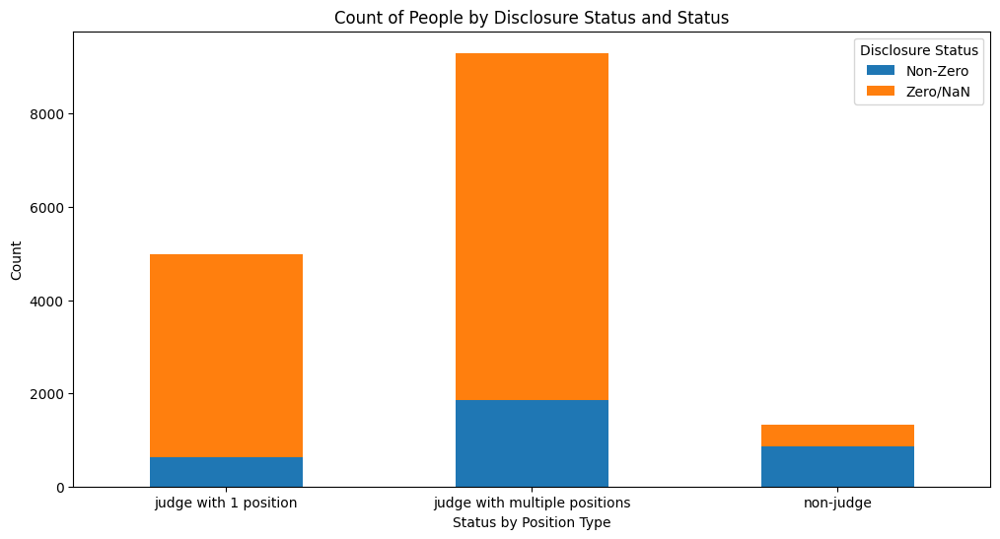

In [84]:
# With this dataframe, let's first create a simple plot: for every status, count of people with disclosure status
people_disclosure_status = people_disc_pos_dates.groupby(['status', 'disclosure_status']).size().unstack().fillna(0)

# Plotting a bar chart for the count of people with disclosure status by status
people_disclosure_status.plot(kind='bar', stacked=True, figsize=(12, 6))
plt.title('Count of People by Disclosure Status and Status')
plt.xlabel('Status by Position Type')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.legend(title='Disclosure Status')
plt.show()

In [96]:
# Since start_date is only for people who are judges, we first filter out non-judges 
# Then Group by year and disclosure status, and count the occurrences
disclosure_plot_by_year_status = people_disc_pos_dates[people_disc_pos_dates['judge_flag'] >= 0]
disclosure_plot_by_year_status = disclosure_plot_by_year_status.groupby(['ds_year_group', 'disclosure_status']).size().unstack(fill_value=0)

# Adding a column called fill percentage - this is non-zero disclosures divided by total disclosures
disclosure_plot_by_year_status['fill_percentage'] = round((disclosure_plot_by_year_status['Non-Zero'] / (disclosure_plot_by_year_status['Non-Zero'] + disclosure_plot_by_year_status['Zero/NaN'])) * 100,2)

# Examine the dataframe
disclosure_plot_by_year_status.head(10)

disclosure_status,Non-Zero,Zero/NaN,fill_percentage
ds_year_group,,,
1900-1920,0,294,0.00
1920-1940,1,639,0.16
1940-1960,4,986,0.40
1960-1980,214,2148,9.06
1980-2000,989,2902,25.42
2000-2020,1223,3867,24.03
2020 and after,29,286,9.21
before 1900,2,563,0.35


**For judges and non-judges, let's look at the race, political affiliation and court name of people who have and don't have financial disclosures**  
dataframe to be used - people_disc_pos_dates

/var/folders/54/mhs5zkcs6zb1_y58hd7pczjc0000gn/T/ipykernel_92216/1450202518.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  judges_df['race'] = judges_df['race'].fillna('Missing')


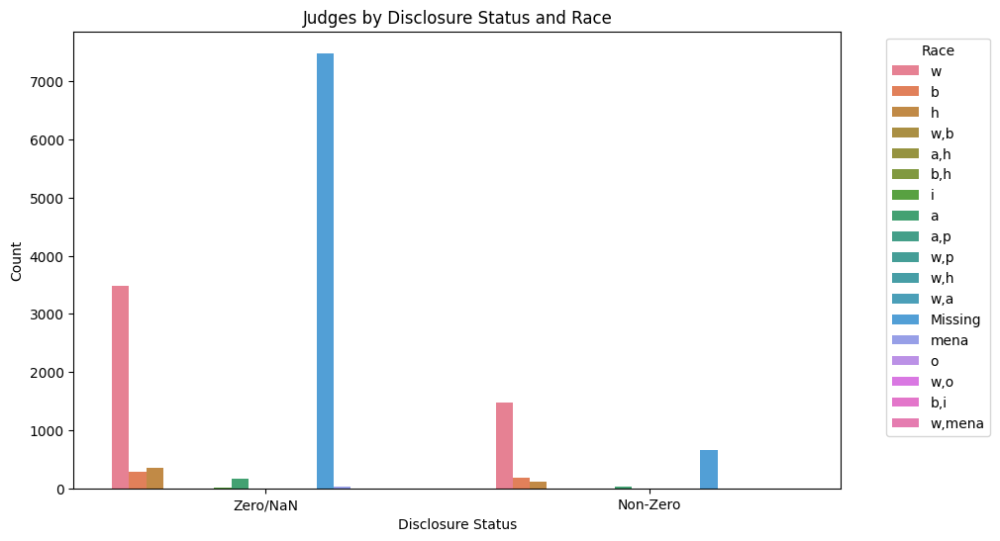

In [112]:
# Judges by disclosure status and race
# Filter for judges (judge_flag >= 1)
judges_df = people_disc_pos_dates[people_disc_pos_dates['judge_flag'] >= 1]

# Fill missing values
judges_df['race'] = judges_df['race'].fillna('Missing')

# Plot: Judges by Disclosure Status and Race
plt.figure(figsize=(10, 6))
sns.countplot(data=judges_df, x='disclosure_status', hue='race')
plt.title('Judges by Disclosure Status and Race')
plt.xlabel('Disclosure Status')
plt.ylabel('Count')
plt.legend(title='Race', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

In [119]:
# Getting counts for the plot above
judges_race_group = judges_df.groupby(['race', 'disclosure_status']).size().unstack(fill_value=0)

# Add a column called total
judges_race_group['total'] = judges_race_group.sum(axis=1)

# Sort by total
judges_race_group = judges_race_group.sort_values(by='total', ascending=False)
judges_race_group

disclosure_status,Non-Zero,Zero/NaN,total
race,,,
Missing,662,7484,8146
w,1478,3483,4961
h,111,360,471
b,176,281,457
a,37,158,195
mena,0,22,22
i,2,4,6
"b,h",2,1,3
"a,p",1,2,3


/var/folders/54/mhs5zkcs6zb1_y58hd7pczjc0000gn/T/ipykernel_92216/2385122575.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  judges_df['political_affiliations'] = judges_df['political_affiliations'].fillna('Missing')


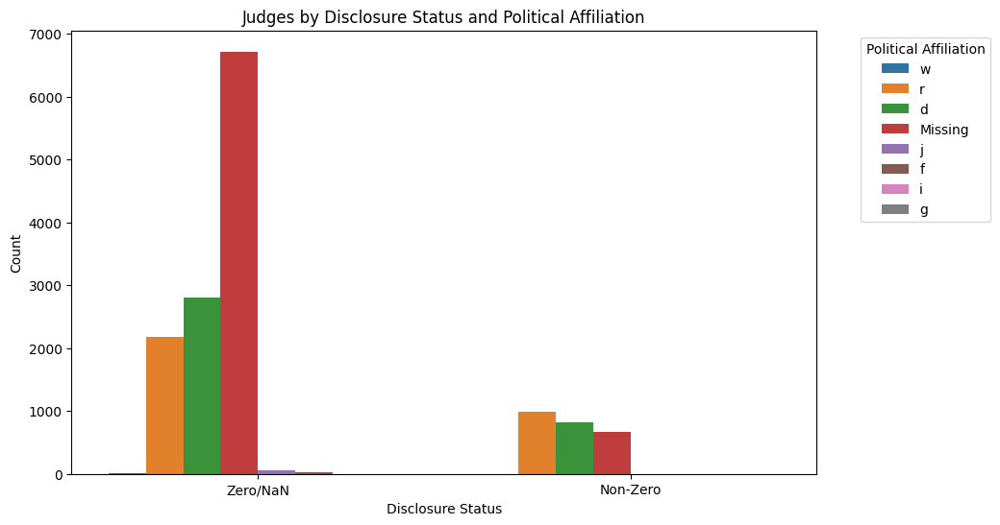

In [114]:
# Judges by disclosure status and political affiliation
# Fill missing values with 'Missing'
judges_df['political_affiliations'] = judges_df['political_affiliations'].fillna('Missing')

plt.figure(figsize=(10, 6))
sns.countplot(data=judges_df, x='disclosure_status', hue='political_affiliations')
plt.title('Judges by Disclosure Status and Political Affiliation')
plt.xlabel('Disclosure Status')
plt.ylabel('Count')
plt.legend(title='Political Affiliation', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

In [120]:
# Getting counts for the plot above
judges_polaff_group = judges_df.groupby(['political_affiliations', 'disclosure_status']).size().unstack(fill_value=0)

# Add a column called total
judges_polaff_group['total'] = judges_polaff_group.sum(axis=1)

# Sort by total
judges_polaff_group = judges_polaff_group.sort_values(by='total', ascending=False)
judges_polaff_group

disclosure_status,Non-Zero,Zero/NaN,total
political_affiliations,,,
Missing,664,6718,7382
d,823,2802,3625
r,989,2181,3170
j,0,61,61
f,0,22,22
w,0,17,17
g,0,1,1
i,0,1,1


In [123]:
# For courts, we create a simple table to show the count of judges by disclosure status and court
judges_by_court_disclosure = judges_df.groupby(['court_full_name', 'disclosure_status']).size().unstack(fill_value=0)
judges_by_court_disclosure['total'] = judges_by_court_disclosure['Non-Zero'] + judges_by_court_disclosure['Zero/NaN']
judges_by_court_disclosure['fill_percentage'] = round((judges_by_court_disclosure['Non-Zero'] / judges_by_court_disclosure['total']) * 100, 2)

# Sort by total number of judges
judges_by_court_disclosure = judges_by_court_disclosure.sort_values(by='total', ascending=False)
judges_by_court_disclosure.head(20)

disclosure_status,Non-Zero,Zero/NaN,total,fill_percentage
court_full_name,,,,
"Superior Court of California, County of Los Angeles",4,1017,1021,0.39
District Court of Appeal of Florida,8,306,314,2.55
"Superior Court of California, County of San Diego",2,277,279,0.72
"Superior Court of California, County of Orange",0,274,274,0.00
Appellate Division of the Supreme Court of the State of New York,1,196,197,0.51
"Superior Court of California, County of Santa Clara",0,184,184,0.00
"Superior Court of California, County of Alameda",1,168,169,0.59
"District Court, District of Columbia",45,111,156,28.85
"Superior Court of California, County of San Bernardino",1,146,147,0.68


In [124]:
# Sort by fill percentage 
# First filter for courts with at least 100 judges
judges_by_court_disclosure = judges_by_court_disclosure[judges_by_court_disclosure['total'] >= 100]
judges_by_court_disclosure = judges_by_court_disclosure.sort_values(by='fill_percentage', ascending=False)
judges_by_court_disclosure.head(10)

disclosure_status,Non-Zero,Zero/NaN,total,fill_percentage
court_full_name,,,,
Court of Appeals for the Ninth Circuit,61,46,107,57.01
"District Court, S.D. New York",69,62,131,52.67
United States Tax Court,44,84,128,34.38
"District Court, District of Columbia",45,111,156,28.85
Supreme Court of the United States,11,96,107,10.28
District Court of Appeal of Florida,8,306,314,2.55
California Court of Appeal,2,100,102,1.96
"Superior Court of California, County of San Francisco",1,121,122,0.82
"Superior Court of California, County of San Diego",2,277,279,0.72


In [125]:
# Calculating the average fill_percentage for all courts
average_fill_percentage = judges_by_court_disclosure['fill_percentage'].mean()
average_fill_percentage

np.float64(9.114761904761906)

/var/folders/54/mhs5zkcs6zb1_y58hd7pczjc0000gn/T/ipykernel_92216/2279812048.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  non_judges_df['race'] = non_judges_df['race'].fillna('Missing')


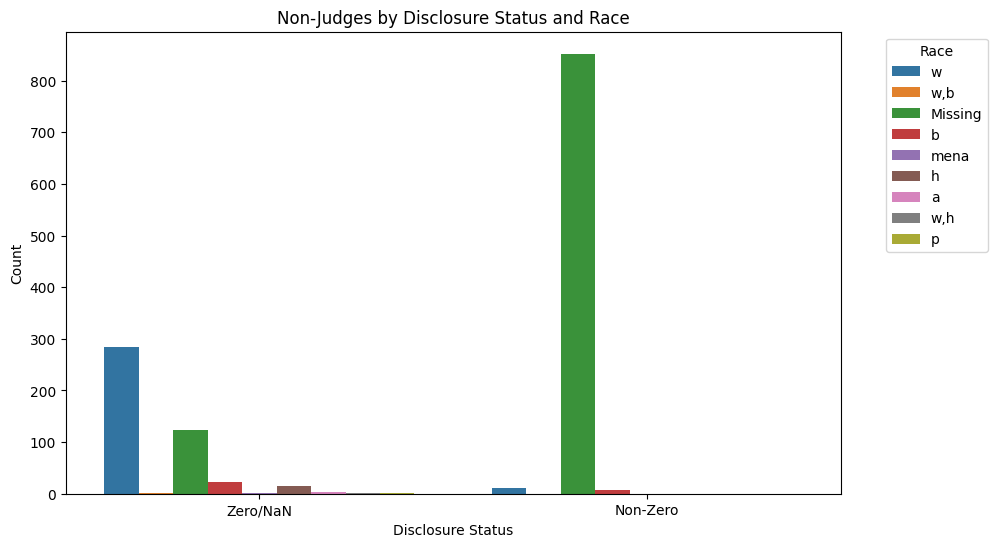

In [113]:
# Similar analysis for non-judges
# Filter for non-judges (judge_flag = 0)
non_judges_df = people_disc_pos_dates[people_disc_pos_dates['judge_flag'] == 0]

# Fill missing values
non_judges_df['race'] = non_judges_df['race'].fillna('Missing')

# Plot: Judges by Disclosure Status and Race
plt.figure(figsize=(10, 6))
sns.countplot(data=non_judges_df, x='disclosure_status', hue='race')
plt.title('Non-Judges by Disclosure Status and Race')
plt.xlabel('Disclosure Status')
plt.ylabel('Count')
plt.legend(title='Race', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

In [126]:
# Getting counts for the plot above
non_judges_race_group = non_judges_df.groupby(['race', 'disclosure_status']).size().unstack(fill_value=0)

# Add a column called total
non_judges_race_group['total'] = non_judges_race_group.sum(axis=1)

# Sort by total
non_judges_race_group = non_judges_race_group.sort_values(by='total', ascending=False)
non_judges_race_group

disclosure_status,Non-Zero,Zero/NaN,total
race,,,
Missing,852,123,975
w,12,285,297
b,7,23,30
h,0,15,15
a,0,4,4
mena,0,1,1
p,0,1,1
"w,b",0,1,1
"w,h",0,1,1


/var/folders/54/mhs5zkcs6zb1_y58hd7pczjc0000gn/T/ipykernel_92216/2529751650.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  non_judges_df['political_affiliations'] = non_judges_df['political_affiliations'].fillna('Missing')


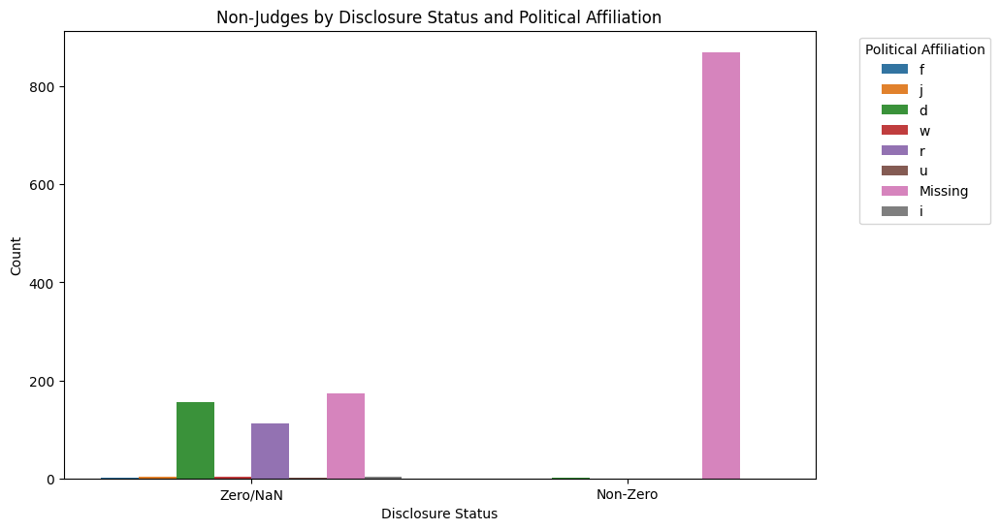

In [115]:
# Plot: Non-Judges by Disclosure Status and Political Affiliation
# Fill missing values with 'Missing'
non_judges_df['political_affiliations'] = non_judges_df['political_affiliations'].fillna('Missing')

plt.figure(figsize=(10, 6))
sns.countplot(data=non_judges_df, x='disclosure_status', hue='political_affiliations')
plt.title('Non-Judges by Disclosure Status and Political Affiliation')
plt.xlabel('Disclosure Status')
plt.ylabel('Count')
plt.legend(title='Political Affiliation', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

In [127]:
# Getting counts for the plot above
non_judges_polaff_group = non_judges_df.groupby(['political_affiliations', 'disclosure_status']).size().unstack(fill_value=0)

# Add a column called total
non_judges_polaff_group['total'] = non_judges_polaff_group.sum(axis=1)

# Sort by total
non_judges_polaff_group = non_judges_polaff_group.sort_values(by='total', ascending=False)
non_judges_polaff_group

disclosure_status,Non-Zero,Zero/NaN,total
political_affiliations,,,
Missing,870,174,1044
d,1,155,156
r,0,112,112
j,0,4,4
i,0,3,3
w,0,3,3
f,0,2,2
u,0,1,1


### Observations from data:
1. Some data are incorrect (id 420)

In [52]:
# Create a dataframe for just positions
df_positions = df_fin_disc[df_fin_disc['type'] == 'position']
columns_to_keep = ['position_id','position','disclosure_year', 'organization_name','date_created','date_modified','position_redacted','person_id', 'filepath', 'notes']
df_positions = df_positions[columns_to_keep]

# Examine the dataframe
df_positions.info()

<class 'pandas.core.frame.DataFrame'>
Index: 37050 entries, 40 to 2019718
Data columns (total 10 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   position_id        37050 non-null  float64
 1   position           36823 non-null  object 
 2   disclosure_year    37050 non-null  int64  
 3   organization_name  36282 non-null  object 
 4   date_created       37050 non-null  object 
 5   date_modified      37050 non-null  object 
 6   position_redacted  37050 non-null  object 
 7   person_id          37050 non-null  int64  
 8   filepath           37050 non-null  object 
 9   notes              24635 non-null  object 
dtypes: float64(1), int64(2), object(7)
memory usage: 3.1+ MB


In [53]:
# Let us see how many unique people and positions exist in the dataset
print(f"Number of unique people: {df_positions['person_id'].nunique()}")
print(f"Number of unique positions: {df_positions['position_id'].nunique()}")

Number of unique people: 2553
Number of unique positions: 37050


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51281 entries, 0 to 51280
Data columns (total 21 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   person_id               51281 non-null  int64  
 1   name_first              51281 non-null  object 
 2   name_middle             43300 non-null  object 
 3   name_last               51281 non-null  object 
 4   political_affiliations  35456 non-null  object 
 5   race                    33919 non-null  object 
 6   position_url            51281 non-null  object 
 7   position_type           30056 non-null  object 
 8   job_title               21225 non-null  object 
 9   sector                  6764 non-null   float64
 10  organization            13248 non-null  object 
 11  date_nominated          4274 non-null   object 
 12  date_start              50412 non-null  object 
 13  date_termination        42457 non-null  object 
 14  court_resource_url      22174 non-null

In [56]:
# Create a union of both dataframes such that all positions data is in one dataframe
# Before doing union, we need to ensure both dataframes have the same columns

# Let us see the columns in both dataframes
#print(f"Columns in df_positions: {df_positions.columns}")
#print(f"Columns in df_persons_positions: {df_persons_positions.columns}")
print(f"Columns in df_positions but not in df_persons_positions: {set(df_positions.columns) - set(df_persons_positions.columns)}")
print(f"Columns in df_persons_positions but not in df_positions: {set(df_persons_positions.columns) - set(df_positions.columns)}")

Columns in df_positions but not in df_persons_positions: {'date_modified', 'disclosure_year', 'position_id', 'position_redacted', 'filepath', 'organization_name', 'date_created', 'notes'}
Columns in df_persons_positions but not in df_positions: {'name_first', 'organization', 'court_url', 'position_type', 'job_title', 'position_url', 'name_last', 'date_termination', 'date_start', 'judge_flag', 'political_affiliations', 'name_middle', 'court_full_name', 'sector', 'date_nominated', 'court_short_name', 'court_id', 'race', 'court_resource_url'}


In [58]:
# We see that the columns in both dataframes are different
# We need to add columns in each dataframe from the other to make them compatible for union

# Adding columns from df_positions to df_persons_positions
all_columns = set(df_positions.columns).union(set(df_persons_positions.columns))
df_positions = df_positions.reindex(columns=all_columns, fill_value=pd.NA)
df_positions['source'] = 'financial_disc'
df_persons_positions = df_persons_positions.reindex(columns=all_columns, fill_value=pd.NA)
df_persons_positions['source'] = 'persons_positions'

In [60]:
# Check columns in both dataframes
df_positions.info()


<class 'pandas.core.frame.DataFrame'>
Index: 37050 entries, 40 to 2019718
Data columns (total 30 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   date_start              0 non-null      object 
 1   name_first              0 non-null      object 
 2   organization            0 non-null      object 
 3   judge_flag              0 non-null      object 
 4   court_url               0 non-null      object 
 5   position_id             37050 non-null  float64
 6   position_redacted       37050 non-null  object 
 7   filepath                37050 non-null  object 
 8   political_affiliations  0 non-null      object 
 9   name_middle             0 non-null      object 
 10  court_full_name         0 non-null      object 
 11  position_type           0 non-null      object 
 12  organization_name       36282 non-null  object 
 13  job_title               0 non-null      object 
 14  person_id               37050 non-null  

In [61]:
# Check columns in both dataframes
df_persons_positions.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51281 entries, 0 to 51280
Data columns (total 30 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   date_start              50412 non-null  object 
 1   name_first              51281 non-null  object 
 2   organization            13248 non-null  object 
 3   judge_flag              51281 non-null  int64  
 4   court_url               20593 non-null  object 
 5   position_id             0 non-null      object 
 6   position_redacted       0 non-null      object 
 7   filepath                0 non-null      object 
 8   political_affiliations  35456 non-null  object 
 9   name_middle             43300 non-null  object 
 10  court_full_name         22174 non-null  object 
 11  position_type           30056 non-null  object 
 12  organization_name       0 non-null      object 
 13  job_title               21225 non-null  object 
 14  person_id               51281 non-null

In [68]:
# Now that both dataframes have the same columns, we can union them
df_all_positions = pd.concat([df_positions, df_persons_positions], axis=0, ignore_index=True)
df_all_positions.info()

/var/folders/54/mhs5zkcs6zb1_y58hd7pczjc0000gn/T/ipykernel_34070/614588782.py:2: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_all_positions = pd.concat([df_positions, df_persons_positions], axis=0, ignore_index=True)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 88331 entries, 0 to 88330
Data columns (total 30 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   date_start              50412 non-null  object 
 1   name_first              51281 non-null  object 
 2   organization            13248 non-null  object 
 3   judge_flag              51281 non-null  object 
 4   court_url               20593 non-null  object 
 5   position_id             37050 non-null  float64
 6   position_redacted       37050 non-null  object 
 7   filepath                37050 non-null  object 
 8   political_affiliations  35456 non-null  object 
 9   name_middle             43300 non-null  object 
 10  court_full_name         22174 non-null  object 
 11  position_type           30056 non-null  object 
 12  organization_name       36282 non-null  object 
 13  job_title               21225 non-null  object 
 14  person_id               88331 non-null

In [69]:
# Modify the dataframe - these operations are not memory efficient and ideally should be done before union

desired_order = [
    'person_id', 'name_first', 'name_middle', 'name_last', 'race', 'political_affiliations', 'judge_flag', 'position',
    'position_id', 'organization', 'organization_name', 'job_title', 'position_type', 'position_url', 'sector',
    'court_url', 'court_short_name', 'court_full_name', 'court_resource_url', 'disclosure_year', 'date_nominated',
    'court_id', 'date_start', 'date_termination', 'date_created', 'date_modified', 'notes', 'position_redacted',
    'filepath', 'source'
]

# Reorder the columns
df_all_positions = df_all_positions.reindex(columns=desired_order)

# Adding two columns - `imputed` and an indicator for whether the person is a judge
df_all_positions['imputed'] = 0
df_all_positions['person_judge'] = 0

# Examine the data
df_all_positions.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 88331 entries, 0 to 88330
Data columns (total 32 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   person_id               88331 non-null  int64  
 1   name_first              51281 non-null  object 
 2   name_middle             43300 non-null  object 
 3   name_last               51281 non-null  object 
 4   race                    33919 non-null  object 
 5   political_affiliations  35456 non-null  object 
 6   judge_flag              51281 non-null  object 
 7   position                88104 non-null  object 
 8   position_id             37050 non-null  float64
 9   organization            13248 non-null  object 
 10  organization_name       36282 non-null  object 
 11  job_title               21225 non-null  object 
 12  position_type           30056 non-null  object 
 13  position_url            51281 non-null  object 
 14  sector                  6764 non-null 

In [70]:
# Function to fill missing data within each group of person_id
def impute_missing_values(group):
    # Determine if the person is a judge
    group['person_judge'] = group['judge_flag'].max()

    for column in columns_to_impute:
        if group[column].isnull().any():
            # Fill missing values using the first non-null value in the group
            group[column] = group[column].fillna(method='ffill').fillna(method='bfill')
            # Mark imputed rows where the source is 'financial_disc' and the value was filled
            group['imputed'] = group['imputed'] | ((group[column].notnull()) & (group['source'] == 'financial_disc')).astype(int)
    
    return group

In [71]:
# Specifying columns for which values need to be imputed
columns_to_impute = ['name_first', 'name_middle', 'name_last', 'race', 'political_affiliations']

# Apply the function to each group of person_id
df_all_positions = df_all_positions.groupby('person_id').apply(impute_missing_values)

# Check the dataframe
df_all_positions.info()

/var/folders/54/mhs5zkcs6zb1_y58hd7pczjc0000gn/T/ipykernel_34070/2926876888.py:9: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group[column] = group[column].fillna(method='ffill').fillna(method='bfill')
/var/folders/54/mhs5zkcs6zb1_y58hd7pczjc0000gn/T/ipykernel_34070/2926876888.py:9: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  group[column] = group[column].fillna(method='ffill').fillna(method='bfill')
/var/folders/54/mhs5zkcs6zb1_y58hd7pczjc0000gn/T/ipykernel_34070/2926876888.py:9: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  group[column] = group[column].fillna(method='ffill').fillna(method

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 88331 entries, (1, 44590) to (16233, 80332)
Data columns (total 32 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   person_id               88331 non-null  int64  
 1   name_first              88331 non-null  object 
 2   name_middle             77128 non-null  object 
 3   name_last               88331 non-null  object 
 4   race                    59628 non-null  object 
 5   political_affiliations  61005 non-null  object 
 6   judge_flag              51281 non-null  object 
 7   position                88104 non-null  object 
 8   position_id             37050 non-null  float64
 9   organization            13248 non-null  object 
 10  organization_name       36282 non-null  object 
 11  job_title               21225 non-null  object 
 12  position_type           30056 non-null  object 
 13  position_url            51281 non-null  object 
 14  sector              

/var/folders/54/mhs5zkcs6zb1_y58hd7pczjc0000gn/T/ipykernel_34070/1945090036.py:5: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_all_positions = df_all_positions.groupby('person_id').apply(impute_missing_values)


In [72]:
# For manual inspection
# df_all_positions.to_csv("sample.csv", index=False)

GPT prompt:
I want to check the following:
1. Unique person_ids who have person_judge = 0 
2.Unique person_ids who have person_judge = 1 
3. For category 2 above:
- How many have ONLY one row against them (count of rows for person_id where person_judge = 1)  
- For those who have more than 1 row, what is the average number of rows (positions)
- For those who have more than 1 row, how many of those rows have source financial_disc and how many have persons_positions

In [73]:
# 1. Unique person_ids who have person_judge = 0
person_ids_judge_0 = df_all_positions[df_all_positions['person_judge'] == 0]['person_id'].unique()

# 2. Unique person_ids who have person_judge = 1
person_ids_judge_1 = df_all_positions[df_all_positions['person_judge'] == 1]['person_id'].unique()

# 3. For category 2 (person_judge = 1)
# Subset the DataFrame to only include rows where person_judge = 1
df_judge_1 = df_all_positions[df_all_positions['person_judge'] == 1]

# 3a. Count how many have ONLY one row
person_id_counts = df_judge_1['person_id'].value_counts()
single_row_judges = person_id_counts[person_id_counts == 1].count()

# 3b. For those who have more than 1 row, what is the average number of rows (positions)
multi_row_judges = person_id_counts[person_id_counts > 1]
average_positions = multi_row_judges.mean()

# 3c. For those who have more than 1 row, how many of those rows have source financial_disc and how many have persons_positions
df_multi_row_judges = df_judge_1[df_judge_1['person_id'].isin(multi_row_judges.index)]
financial_disc_count = df_multi_row_judges[df_multi_row_judges['source'] == 'financial_disc'].shape[0]
persons_positions_count = df_multi_row_judges[df_multi_row_judges['source'] == 'persons_positions'].shape[0]

# Display the results
print(f"Unique person_ids with person_judge = 0: {len(person_ids_judge_0)}")
print(f"Unique person_ids with person_judge = 1: {len(person_ids_judge_1)}")
print(f"Number of judges with ONLY one row: {single_row_judges}")
print(f"Average number of rows (positions) for judges with more than one row: {average_positions}")
print(f"Number of rows with source 'financial_disc' for multi-row judges: {financial_disc_count}")
print(f"Number of rows with source 'persons_positions' for multi-row judges: {persons_positions_count}")

Unique person_ids with person_judge = 0: 1325
Unique person_ids with person_judge = 1: 14279
Number of judges with ONLY one row: 4551
Average number of rows (positions) for judges with more than one row: 7.749280427631579
Number of rows with source 'financial_disc' for multi-row judges: 30689
Number of rows with source 'persons_positions' for multi-row judges: 44696
